In [1]:
%pylab inline

import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

from ddmap import halosim
from ddmap.pixel3D import cartesianGrid3D
from ddmap.sparse import darkmapper
from ddmap import detect3D
from ddmap.halolet import massmap_ks2D

Populating the interactive namespace from numpy and matplotlib


In [2]:
# configuration
configName  =   '../../tests/config_sparse.ini' 
parser      =   ConfigParser()
parser.read(configName)

# Reconstruction Init
parser.set('sparse','mu','3e-4')
if False:
    atomFname='../../tests/haloBasis-nl10-pix48-m146_152.fits'
    parser.set('lens','atomFname',atomFname)
    parser.set('sparse','nframe','1' )
else:
    parser.set('lens','resolve_lim','0.2') #pix
    parser.set('lens','rs_base','0.308962690266535')    #Mpc/h
    parser.set('sparse','nframe','1' )
    
# Pixelation
gridInfo=   cartesianGrid3D(parser)
Z,Y,X   =   np.meshgrid(gridInfo.zcgrid,gridInfo.ycgrid,gridInfo.xcgrid,indexing='ij')
x,y,z   =   (X.flatten(),Y.flatten(),Z.flatten())
lensKer1 =   gridInfo.lensing_kernel(deltaIn=False)
lensKer2 =   gridInfo.lensing_kernel(deltaIn=True)

In [3]:
z_h     =  0.2425
log_m   =  14.745
M_200   =  10.**(log_m)
conc    =  4.#6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
halo    =  halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
lk      =  halo.lensKernel(z)
data1   =  halo.DeltaSigmaComplex(x*3600.,y*3600.)*lk
data1   =  data1.reshape(gridInfo.shape)

ks2D=massmap_ks2D(gridInfo.ny,gridInfo.nx)
rpix=halo.rs_arcsec/gridInfo.scale/3600.
sigma=halosim.haloCS02SigmaAtom(rpix,ny=gridInfo.ny,nx=gridInfo.nx,\
                                sigma_pix=-1,c=halo.c,fou=True)
snorm=sigma[0,0]
dr      =  halo.DaLens*gridInfo.scale/180*np.pi
snorm=M_200/dr**2./snorm
sigma=sigma*snorm
shear=np.fft.fftshift(ks2D.transform(sigma,inFou=True,outFou=False))
lk2=lk.reshape(gridInfo.shape)
data2=shear[None,:,:]*lk2
if False:
    noistd=0.05
    data2=data2+np.random.randn(gridInfo.nz,gridInfo.ny,gridInfo.nx)*noistd
    gErr    =  np.ones(gridInfo.shape)*noistd
else:
    gErr    =  np.ones(gridInfo.shape)*0.05
    
dmapper=darkmapper(parser,data2.real,data2.imag,gErr,lensKer1)

# spazse analysis

CPU times: user 12.9 s, sys: 3.21 ms, total: 12.9 s
Wall time: 13 s


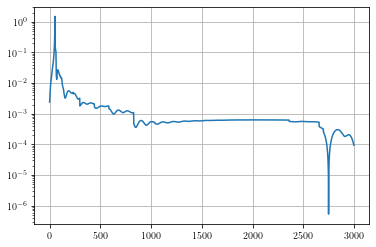

In [4]:
%%time
if True:
    dmapper.lbd=8.
    dmapper.lcd=0.
    dmapper.nonNeg=True
    dmapper.clean_outcomes()
    dmapper.fista_gradient_descent(3000)
else:
    dmapper.lbd=0.
    dmapper.lcd=1.
    dmapper.nonNeg=False
    dmapper.clean_outcomes()
    dmapper.optimized_gradient_descent(3000)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 12.5 s, sys: 0 ns, total: 12.5 s
Wall time: 12.6 s


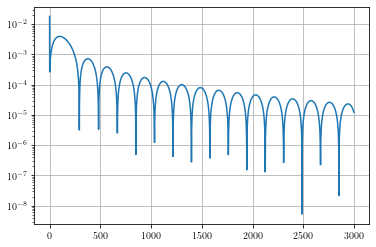

In [5]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(3000,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 43.2 s, sys: 6.51 ms, total: 43.2 s
Wall time: 43.3 s


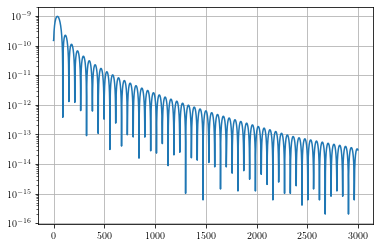

In [6]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.mu=3e-3
dmapper.nonNeg=True
for i in range(3):
    w   =   dmapper.adaptive_lasso_weight(gamma=2.)
    dmapper.fista_gradient_descent(3000,w=w)
    dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

In [7]:
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(dmapper.deltaR[:,:,:])
data1   =   np.hstack([c1,v1[:,None]])
src     =   Table(data=data1,names=names)

In [8]:
c1

array([[ 4, 24, 24]])

In [9]:
src

iz,iy,ix,value
float64,float64,float64,float64
4.0,24.0,24.0,47.21283541766987


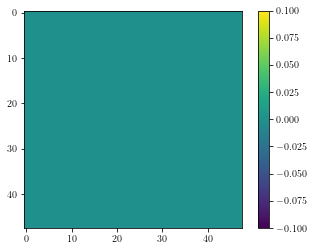

In [10]:
plt.imshow(dmapper.deltaR[5])
plt.colorbar()

In [11]:
np.log10((dmapper.alphaR*dmapper._w)[:,0,gridInfo.ny//2,gridInfo.nx//2])+14.

/tmp/ipykernel_32738/2505763115.py:1: RuntimeWarning: divide by zero encountered in log10
  np.log10((dmapper.alphaR*dmapper._w)[:,0,gridInfo.ny//2,gridInfo.nx//2])+14.


array([       -inf,        -inf,        -inf,        -inf, 14.74432681,
              -inf,        -inf,        -inf,        -inf,        -inf])

In [12]:
gridInfo.zlcgrid

array([0.0625, 0.1075, 0.1525, 0.1975, 0.2425, 0.2875, 0.3325, 0.3775,
       0.4225, 0.4675])

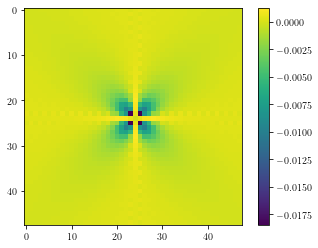

In [13]:
plt.imshow(ks2D.itransform(dmapper.shearRRes[6]).real);plt.colorbar()

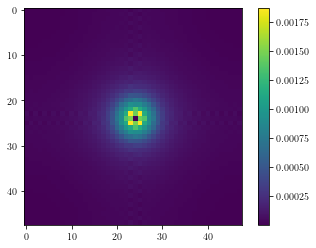

In [14]:
plt.imshow(np.abs(dmapper.shearRRes[6]));plt.colorbar()

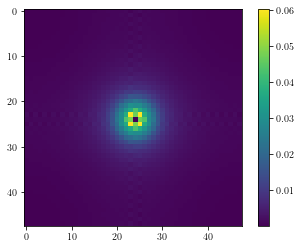

In [15]:
plt.imshow(np.abs(data2[6]));plt.colorbar()

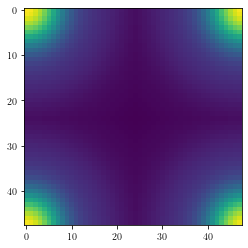

In [16]:
plt.imshow(dmapper.modelDict.fouaframesInter[4,0].real*M_200)

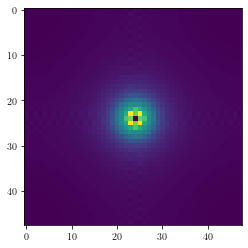

In [17]:
plt.imshow(np.fft.fftshift(np.abs(dmapper.modelDict.aframes[4,0])))

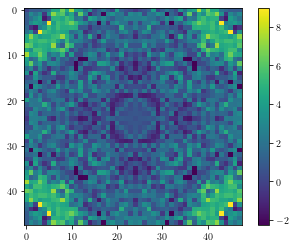

In [18]:
plt.imshow(dmapper.modelDict.fouaframesInter[4,0].real*M_200-sigma);plt.colorbar()